[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/sachaMorin/dino/blob/main/object_detection_train.ipynb)

# Detectron2 Beginner's Tutorial - Edited to train DINO pretrained backbone!

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

# Install detectron2

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 8.5 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=34a9a508586c7c314f931eb577d0e0fa43682a1cf179ad3d099fd5bf1a979473
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 6.3 MB/s 
     |████████████████████████████████| 130 kB 14.2 MB/s 
     |████████████████████████████████| 74 kB 3.0 MB/s 
     |████████████████████████████████| 145 kB 55.1 MB/s 
     |████████████████████████████████| 49 kB 6.2 MB/s 
     |████████████████████████████████| 749 kB 46.4 MB/s 
     |███████████████████████████████

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
from typing import List

from google.colab import drive
drive.mount('/content/drive')

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

Mounted at /content/drive


# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

def get_duckietown_dicts(dataset_path):
    """
    Arrange the annotations file as a list in COCO format.
    @param dataset_path: Path to the train/test set
    @return: List of elements in the dataset in COCO format
    """
    # Defining paths and variables
    annotation_file = os.path.join(dataset_path, 'annotations')
    frame_path = os.path.join(dataset_path, 'frames')
    # Loading dataset
    with open(os.path.join(annotation_file, 'anns.json')) as f:
        data = json.load(f)

    dataset_dicts = []
    for idx, image_id in enumerate(data.keys()):
        image_name = os.path.join(frame_path, image_id)
        record = {}
        height, width = cv2.imread(image_name).shape[:2]

        record["file_name"] = image_name
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        objs = []
        for annotation in data[image_id]:
            obj_ann = {
                "bbox": [annotation['bbox'][0], annotation['bbox'][1],
                         annotation['bbox'][0] + annotation['bbox'][2],
                         annotation['bbox'][1] + annotation['bbox'][3]],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": annotation['cat_id'] - 1,
                "iscrowd": 0
            }
            objs.append(obj_ann)
        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts

data_path = '<YOUR_PATH_TO_DATASET>'
class_list = ['cone', 'duckie', 'duckiebot']
for d in ["train", "test"]:
    DatasetCatalog.register("duckietown_" + d,
                            lambda d=d: get_duckietown_dicts(os.path.join(data_path, d)))
    MetadataCatalog.get('duckietown_' + d).set(thing_classes=class_list)

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



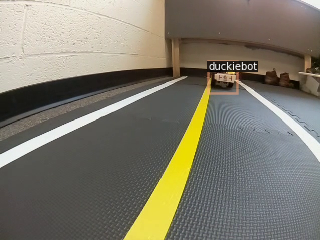

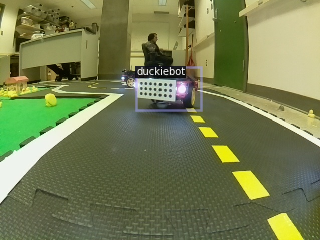

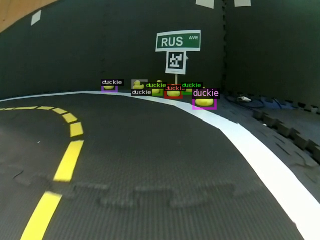

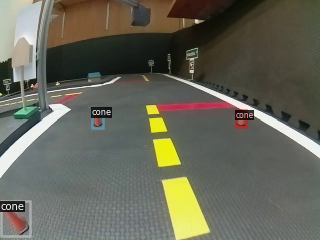

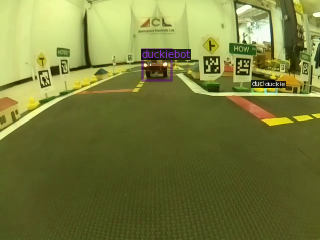

In [ ]:
def visualize_dataset(duckietown_metadata: detectron2.data.catalog.Metadata,
                          dataset_dicts: List, imgs: int = 3) -> None:
    """
    Visualize a given set of instances in the train/test set
    @param duckietown_metadata: Metadata file with duckietown claases
    @param dataset_dicts:  List with bounding boxes and classes information
    @param imgs: Number of images to display
    @return: None
    """
    for d in random.sample(dataset_dicts, imgs):
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=duckietown_metadata, scale=0.5)
        out = visualizer.draw_dataset_dict(d)
        cv2_imshow(out.get_image()[:, :, ::-1])

# Visualizing a random image
duckietown_metadata = MetadataCatalog.get('duckietown_train')
dataset_dicts = get_duckietown_dicts(os.path.join(data_path, 'train')) # This is really slow
visualize_dataset(duckietown_metadata, dataset_dicts, 5)

## Train!

Baseline Training!


In [ ]:
from detectron2.engine import DefaultTrainer
import yaml
import torch

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("duckietown_train",)
cfg.DATASETS.TEST = ("duckietown_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 6
cfg.SOLVER.BASE_LR = 0.0125 # 0.015
cfg.SOLVER.MAX_ITER = 2000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(class_list)  # Number of classes
cfg.TEST.EVAL_PERIOD = 1000
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
final_config = cfg.dump()
yaml_config = yaml.full_load(final_config)
with open(os.path.join(cfg.OUTPUT_DIR, 'cfg.yaml'), 'w') as f:
    yaml.dump(yaml_config, f, default_flow_style=False)
# Saving config
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
print("Start training")
trainer.train()
print('Saving model')
torch.save(trainer.model, os.path.join(cfg.OUTPUT_DIR, 'model.pth'))

[11/16 18:26:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:15, 10.8MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

Start training
[11/16 18:27:27 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/16 18:27:42 d2.utils.events]:  eta: 0:25:37  iter: 19  total_loss: 1.655  loss_cls: 1.211  loss_box_reg: 0.3735  loss_rpn_cls: 0.02861  loss_rpn_loc: 0.01375  time: 0.7614  data_time: 0.0718  lr: 0.00024976  max_mem: 5917M
[11/16 18:27:58 d2.utils.events]:  eta: 0:25:23  iter: 39  total_loss: 0.8366  loss_cls: 0.3798  loss_box_reg: 0.3966  loss_rpn_cls: 0.03066  loss_rpn_loc: 0.01337  time: 0.7632  data_time: 0.0629  lr: 0.00049951  max_mem: 5917M
[11/16 18:28:13 d2.utils.events]:  eta: 0:25:06  iter: 59  total_loss: 0.7348  loss_cls: 0.2859  loss_box_reg: 0.4264  loss_rpn_cls: 0.02059  loss_rpn_loc: 0.01087  time: 0.7594  data_time: 0.0634  lr: 0.00074926  max_mem: 5917M
[11/16 18:28:28 d2.utils.events]:  eta: 0:24:53  iter: 79  total_loss: 0.7035  loss_cls: 0.1979  loss_box_reg: 0.466  loss_rpn_cls: 0.01147  loss_rpn_loc: 0.01057  time: 0.7610  data_time: 0.0632  lr: 0.00099901  max_mem: 5917M
[11/16 18:28:43 d2.utils.events]:  eta: 0:24:39  iter: 99  total_loss: 0.6476  loss_cls

DINO training!

In [ ]:
from detectron2.engine import DefaultTrainer
import yaml
import torch

cfg = get_cfg()
cfg.merge_from_file('/content/drive/MyDrive/AV/model/faster_rcnn_R_50_FPN_3x_dino.yaml')
cfg.DATASETS.TRAIN = ("duckietown_train",)
cfg.DATASETS.TEST = ("duckietown_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/AV/model/resnet50_d2d.pkl'
cfg.SOLVER.IMS_PER_BATCH = 6
cfg.SOLVER.BASE_LR = 0.015   # 0.015
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.SOLVER.MAX_ITER = 2000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(class_list)  # Number of classes
cfg.TEST.EVAL_PERIOD = 1000
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
final_config = cfg.dump()
yaml_config = yaml.full_load(final_config)
with open(os.path.join(cfg.OUTPUT_DIR, 'cfg.yaml'), 'w') as f:
    yaml.dump(yaml_config, f, default_flow_style=False)
# Saving config
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
print("Start training")
trainer.train()
print('Saving model')
torch.save(trainer.model, os.path.join(cfg.OUTPUT_DIR, 'model.pth'))


WARNING [11/16 19:54:46 d2.config.compat]: Config '/content/drive/MyDrive/AV/model/faster_rcnn_R_50_FPN_3x_dino.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[11/16 19:54:56 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64

Some model parameters or buffers are not found in the checkpoint:
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  res2.0.conv1.norm.num_batches_tracked
  res2.0.conv2.norm.num_batches_tracked
  res2.0.conv3.norm.num_batches_tracked
  res2.0.shortcut.norm.num_batches_tracked
  res2.1.conv1.norm.num_batches_tracked
  res2.1.conv2.norm.num_batches_tracked
  res2.1.conv3.norm.num_batches_tracked
  res2.2.conv1.norm.num_batches_tracked
  res2.2.conv2.norm.num_batches_tracked
  res2.2.conv3.norm.num_batches_tracked
  res3.0.conv1.norm.num_batches_tracked
  res3.0.conv2.norm.num_batches_tracked
  res3.0.conv3.norm.num_batches_tracked
  res3.0.shortcut.norm.num_batches_tracked
  res3.1.conv1.norm.num_batches_

Start training
[11/16 19:55:16 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/16 19:55:51 d2.utils.events]:  eta: 0:57:21  iter: 19  total_loss: 2.128  loss_cls: 1.345  loss_box_reg: 0.07645  loss_rpn_cls: 0.6694  loss_rpn_loc: 0.04394  time: 1.7422  data_time: 0.0816  lr: 0.00029971  max_mem: 8100M
[11/16 19:56:26 d2.utils.events]:  eta: 0:57:01  iter: 39  total_loss: 1.688  loss_cls: 0.9641  loss_box_reg: 0.09149  loss_rpn_cls: 0.5411  loss_rpn_loc: 0.04104  time: 1.7461  data_time: 0.0712  lr: 0.00059941  max_mem: 8100M
[11/16 19:57:01 d2.utils.events]:  eta: 0:56:38  iter: 59  total_loss: 0.9426  loss_cls: 0.4736  loss_box_reg: 0.09983  loss_rpn_cls: 0.3195  loss_rpn_loc: 0.02809  time: 1.7501  data_time: 0.0696  lr: 0.00089911  max_mem: 8100M
[11/16 19:57:36 d2.utils.events]:  eta: 0:56:06  iter: 79  total_loss: 0.6459  loss_cls: 0.2702  loss_box_reg: 0.1067  loss_rpn_cls: 0.1921  loss_rpn_loc: 0.02963  time: 1.7525  data_time: 0.0714  lr: 0.0011988  max_mem: 8100M
[11/16 19:58:12 d2.utils.events]:  eta: 0:55:31  iter: 99  total_loss: 0.5749  loss_cls: 

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9   # set a custom testing threshold
#Pass the validation dataset
cfg.DATASETS.TEST = ("duckietown_test", )
predictor = DefaultPredictor(cfg)

# new_config = get_cfg()
# new_config.merge_from_file("/content/video_analytics/model_artifacts_trained/model_config_trained.yml")

Then, we randomly select several samples to visualize the prediction results.

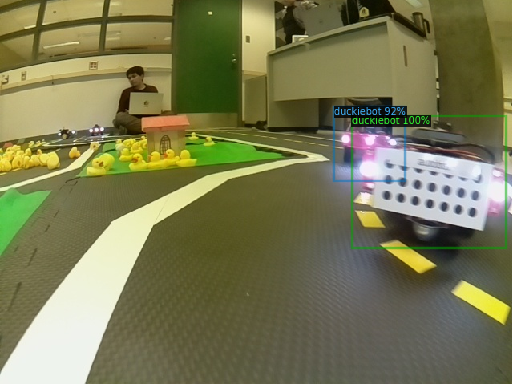

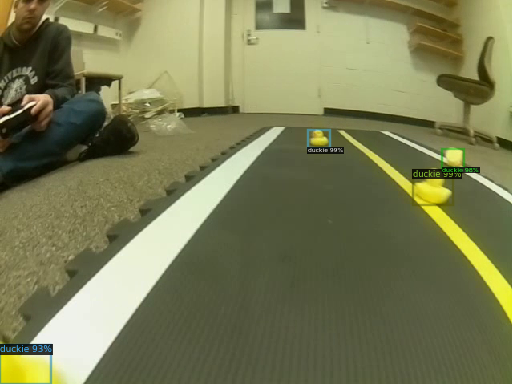

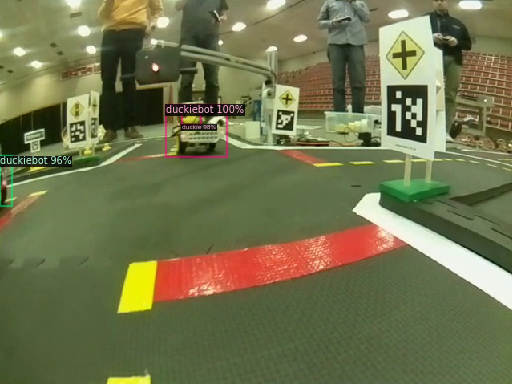

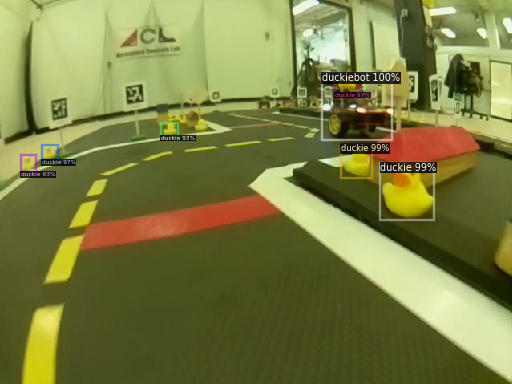

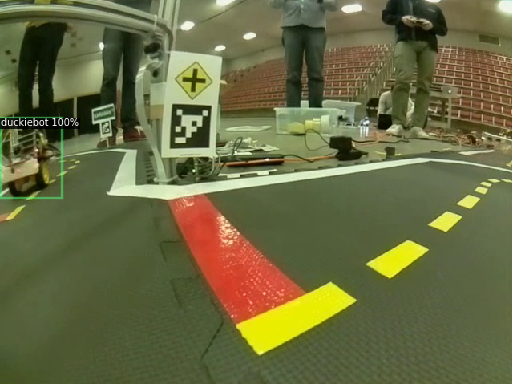

...

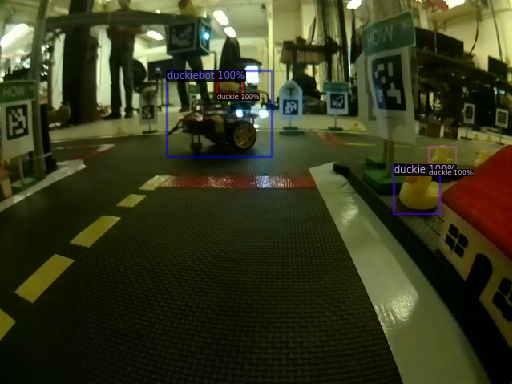

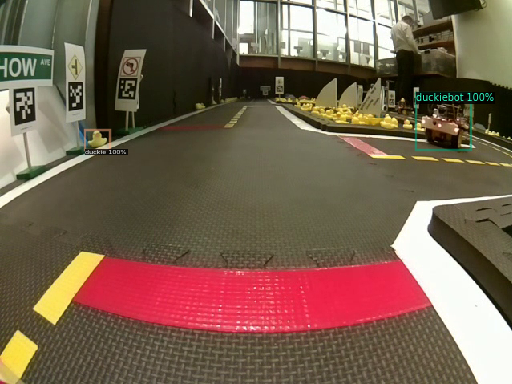

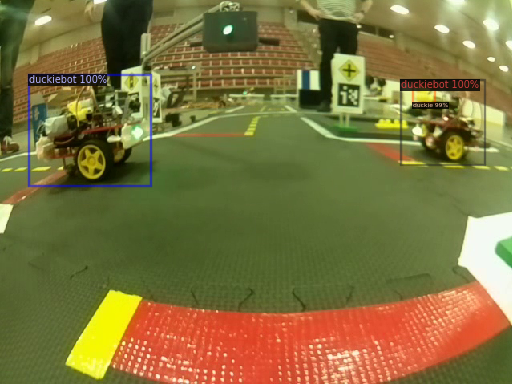

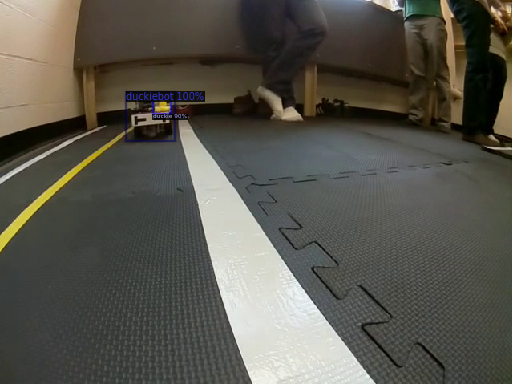

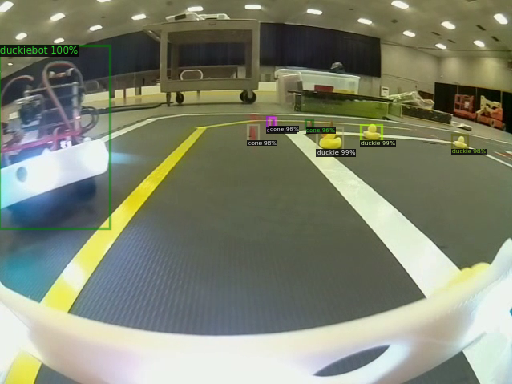

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_duckietown_dicts(os.path.join(data_path, 'test'))
for d in random.sample(dataset_dicts, 20):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=duckietown_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("duckietown_test", cfg, False, output_dir="./output")
val_loader = build_detection_test_loader(cfg, "duckietown_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [11/16 21:04:41 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/16 21:04:41 d2.evaluation.coco_evaluation]: Trying to convert 'duckietown_test' to COCO format ...
[11/16 21:04:41 d2.data.datasets.coco]: Converting annotations of dataset 'duckietown_test' to COCO format ...)
[11/16 21:04:53 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/16 21:04:53 d2.data.datasets.coco]: Conversion finished, #images: 977, #annotations: 2524
[11/16 21:04:53 d2.data.datasets.coco]: Caching COCO format annotations at './output/duckietown_test_coco_format.json' ...
[11/16 21:05:04 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/16 21:05:04 d2.data.common]: Serializing 977 elements to byte tensors and concatenating them all ...
[11/16 21:05:04 d2.data.common]: